<a href="https://colab.research.google.com/github/Yagwar/Proyectos/blob/master/Linkdin_contacts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import random
import time
import pickle
%matplotlib inline
import matplotlib.animation as animation
matplotlib.style.use('seaborn')

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation

from sklearn import manifold
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from wordcloud import WordCloud
from sklearn.neighbors import kneighbors_graph

from mpl_toolkits.mplot3d import Axes3D

clrs_7=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628'])#'#d9d9d9',

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
files_route="gdrive/My Drive/Freelancer/linkedin contacts/"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
start_exec=time.time()

In [4]:
dat=pd.read_csv(files_route+"Connections.csv")
print(dat.columns)
dat["Connected On"]=pd.to_datetime(dat["Connected On"])

Index(['First Name', 'Last Name', 'Email Address', 'Company', 'Position',
       'Connected On'],
      dtype='object')


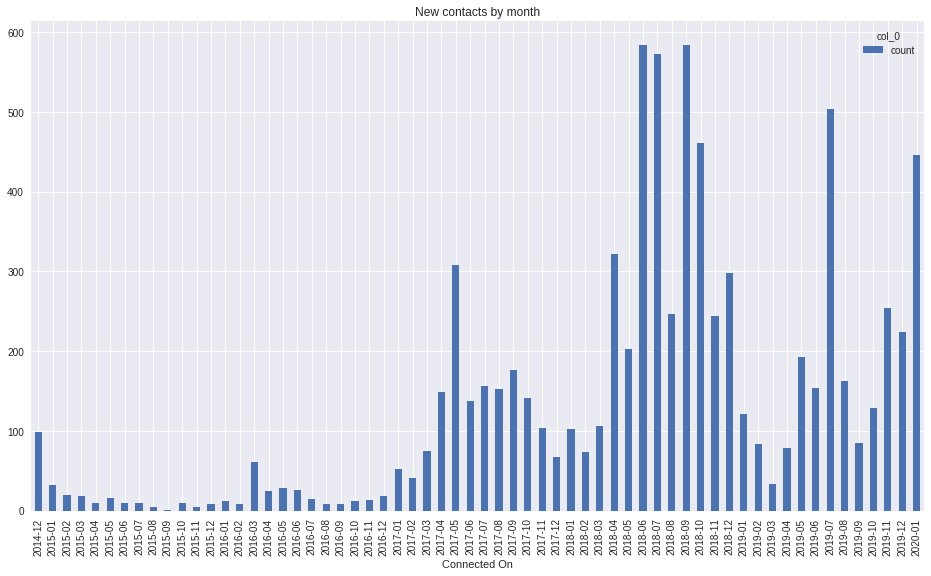

In [5]:
contact_date = pd.crosstab(index=dat["Connected On"].dt.to_period('m'),
                           columns="count")
contact_date.plot(kind="bar",figsize=(16,9), title="New contacts by month")#, cmap=clrs_7)

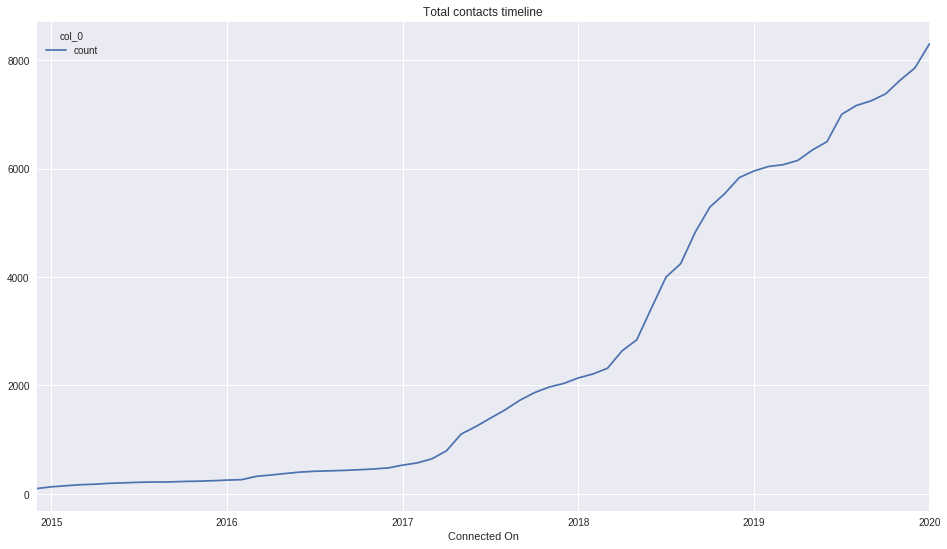

In [6]:
contact_date.cumsum().plot(figsize=(16,9),title="Total contacts timeline")#,cmap=clrs_7)
# plt.yscale('log')

In [0]:
dat["Description"]=dat["Company"]+" "+dat["Position"]

In [8]:
### Non Company Description Accounts
print("Proportion of Non Company Description Accounts: ", sum(pd.isna(dat["Description"]))/len(pd.isna(dat["Description"])))
data=dat.dropna(subset=["Description"])#(how='any')
print("Filtered Contacts", len(pd.isna(data["Description"])))
#dat.iloc(pd.isna(dat["Description"]))
data.shape

Proportion of Non Company Description Accounts:  0.03950855215610696
Filtered Contacts 7974


(7974, 7)

In [9]:
dat.shape

(8302, 7)

## preprocessing

In [0]:
stp_wrds=['de','en','del','la','las','sas','inc','in','of','the','el','los','ltda','com','ltd','and','llc',
     'para','san','sa','co','con','for','it','esp','eps','corp','at','av','sm','cia']

In [11]:
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7974, 8848)

In [12]:
#np.array([n_grams_counts.toarray().sum(axis=0),count_vect.get_feature_names()])
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (np.array(top_features[:50]))

[['data' '1025']
 ['scientist' '558']
 ['analista' '514']
 ['colombia' '492']
 ['senior' '448']
 ['director' '431']
 ['manager' '408']
 ['universidad' '379']
 ['engineer' '350']
 ['gerente' '308']
 ['analyst' '269']
 ['business' '261']
 ['analytics' '243']
 ['consultant' '227']
 ['profesional' '209']
 ['software' '192']
 ['learning' '190']
 ['nacional' '189']
 ['banco' '187']
 ['jefe' '181']
 ['consultor' '179']
 ['selección' '178']
 ['science' '175']
 ['group' '173']
 ['research' '169']
 ['founder' '169']
 ['talento' '169']
 ['gestión' '163']
 ['docente' '163']
 ['desarrollo' '162']
 ['ceo' '157']
 ['talent' '155']
 ['grupo' '150']
 ['machine' '146']
 ['developer' '144']
 ['digital' '144']
 ['humano' '142']
 ['coordinador' '137']
 ['lead' '136']
 ['comercial' '131']
 ['ai' '131']
 ['psicóloga' '124']
 ['seguros' '123']
 ['marketing' '119']
 ['head' '118']
 ['universitaria' '117']
 ['intelligence' '113']
 ['coordinadora' '113']
 ['specialist' '112']
 ['humana' '111']]


### Diccionario de normalización de términos

In [13]:
esp_words=[ 'universidad', 'nacional', 'banco', 'grupo', 'universitaria', 'fundación', 'seguros',
 'independiente', 'salud', 'corporación', 'centro', 'instituto', 'servicios', 'colegio',
 'consultores', 'pontificia', 'oficial', 'distrital', 'andina', 'educación', 'secretaria',
 'agencia', 'colombiana', 'católica', 'escuela', 'departamento',
 'humano', 'secretaría', 'soluciones', 'estadística',
 'organización', 'clínica', 'ministerio', 'seguridad', 'desarrollo', 'empresarial', 'fundacion', 'fundación',
 'integral', 'internacional', 'administrativo', 'casa', 'editorial', 'minuto',
 'talento', 'valle', 'universidade', 'consultoría', 'ingeniería', 'santo', 'gimnasio',
 'comercializadora', 'colombiano', 'servicio',
 'ejercito', 'investigación', 'tiempo', 'vida', 'alcaldia', 'fondo', 'bienestar',
 'inversiones', 'caja', 'consultoria', 'rosario', 'occidente', 'financiera', 'alianza', 'clinica',
 'asociados', 'nivel', 'bosque', 'corredores', 'tecnología',
 'psicología','psicologia', 'generales', 'hogar', 'estudios', 'comercial',
 'compañía', 'latinoamericana', 'particular', 'empleo', 'comercio', 'professional',
 'digital', 'alcaldía', 'unidad', 'ventas', 'financieros', 'empresa', 'gestión', 'industria',
 'industriales', 'empresariales', 'pedagógica', 'república', 'norte', 'consultora',
 'mercantil', 'asociación', 'comunicaciones', 'asesorías',
 'consultor', 'terciarios', 'área', 'integración', 'artificial', 'cooperativa',
 'transportes','freelance','freelancer','consultant', 'datos',
 'analista','análisis','gerente','profesional','selección','seleccion','humanos',
 'psicólogo','psicóloga','psicologo','psicologa','psychologist','directora',
 'estadístico','estadística','estadistico','analyst','científico','científica','ciencia',
 'operaciones','riesgo', 'procesos','desarrollador', 'mercadeo','profesor','profesora', 'docente',
 'cátedra','catedrático','catedrática','analítica','ventas','fundador'] 

eng_words=['university', 'national', 'bank', 'group', 'university', 'foundation', 'insurance',
 'independent', 'health', 'corporation', 'center', 'institute', 'services', 'school',
 'consultancy', 'pontifical', 'official', 'district', 'andean', 'education', 'secretary',
 'agency', 'colombian', 'catholic', 'school', 'department',
 'human', 'secretary', 'solutions', 'statistics',
 'organization', 'clinic', 'ministry', 'security', 'development', 'business', 'foundation', 'foundation',
 'integral', 'international', 'administrative', 'house', 'editorial', 'minute',
 'talent', 'valley', 'university', 'consulting', 'engineering', 'saint', 'gym',
 'sales', 'colombian', 'servicio',
 'army', 'research', 'time', 'life', 'mayor', 'fund', 'wellness',
 'investments', 'box', 'consultancy', 'rosary', 'occident', 'financial', 'alliance', 'clinic',
 'associates', 'level', 'forest', 'broker', 'technology',
 'psychology','psychology', 'generals', 'home', 'studies', 'commercial',
 'company', 'latam', 'private', 'employment', 'commerce', 'professional',
 'digital', 'mayor', 'unit', 'sales', 'financial', 'company', 'management', 'industry',
 'industry', 'business', 'pedagogical', 'republic', 'north', 'consultancy',
 'mercantile', 'association', 'communications', 'consultancy',
 'consultancy', 'tertiary', 'area', 'integration', 'artificial', 'cooperative',
 'transport','consultancy','consultancy','consultancy','data',
 'analysis','analysis','manager','professional','selection','selection','human',
 'psychology','psychology','psychology','psychology','psychology','director',
 'statistics','statistics','statistics','analysis','scientist','scientist','science',
 'operations','risk','process','developer','marketing','professor','professor','professor',
 'professor','professor','professor','analytics','sales','founder']
len(esp_words)==len(eng_words)

True

In [14]:
print("START lower case and unify most frequent words languaje")
for i in data.Description.index:
    jb_desc=str(data.Description[i]).lower()
    for n_wd in range (len (esp_words)):
        jb_desc = jb_desc.replace(esp_words[n_wd], eng_words[n_wd])
    data.Description[i]=jb_desc
#     print(i)
print("END")

START lower case and unify most frequent words languaje


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


END


In [15]:
# Repeat vectorization after replacement frequent terms
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7974, 8701)

In [0]:
# data.sample(25)

In [17]:
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (np.array(top_features[:50]))

[['data' '1133']
 ['analysis' '824']
 ['manager' '716']
 ['consultancy' '639']
 ['scientist' '605']
 ['university' '594']
 ['director' '539']
 ['colombia' '492']
 ['senior' '448']
 ['psychology' '408']
 ['engineer' '350']
 ['talent' '324']
 ['group' '323']
 ['professor' '305']
 ['business' '303']
 ['analytics' '288']
 ['development' '256']
 ['management' '248']
 ['research' '242']
 ['professional' '237']
 ['human' '219']
 ['selection' '215']
 ['national' '210']
 ['bank' '206']
 ['founder' '201']
 ['software' '192']
 ['learning' '190']
 ['science' '183']
 ['jefe' '181']
 ['developer' '166']
 ['ceo' '157']
 ['marketing' '153']
 ['services' '150']
 ['insurance' '148']
 ['machine' '146']
 ['digital' '144']
 ['foundation' '142']
 ['commercial' '141']
 ['statistics' '141']
 ['coordinador' '137']
 ['lead' '136']
 ['ai' '131']
 ['solutions' '125']
 ['international' '122']
 ['consulting' '121']
 ['head' '118']
 ['intelligence' '113']
 ['coordinadora' '113']
 ['specialist' '112']
 ['independent'

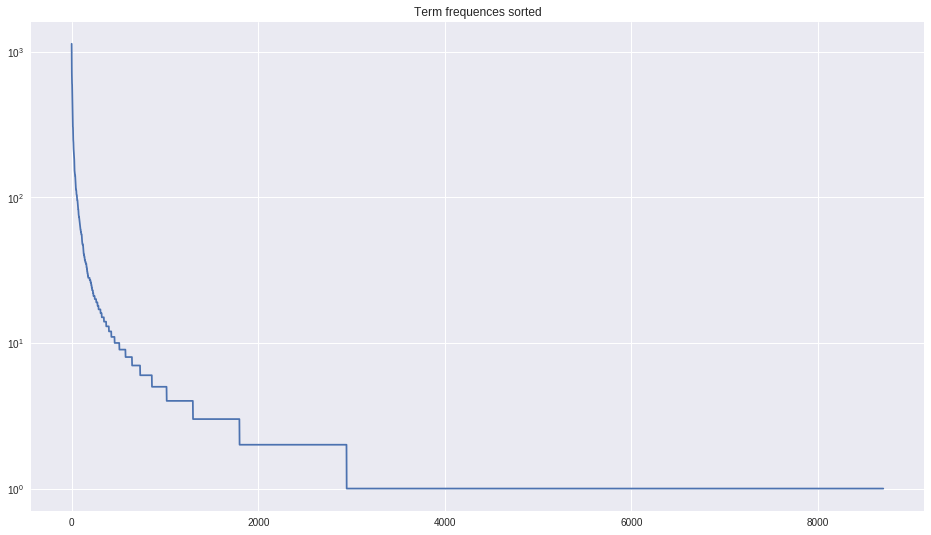

In [18]:
plt.figure(figsize=(16,9))
plt.plot(txt_freqs[indices])
plt.title("Term frequences sorted")
#txt_freqs[indices[:top_n]]
plt.yscale('log')

Text(0.5, 1.0, 'Terms count by profile')

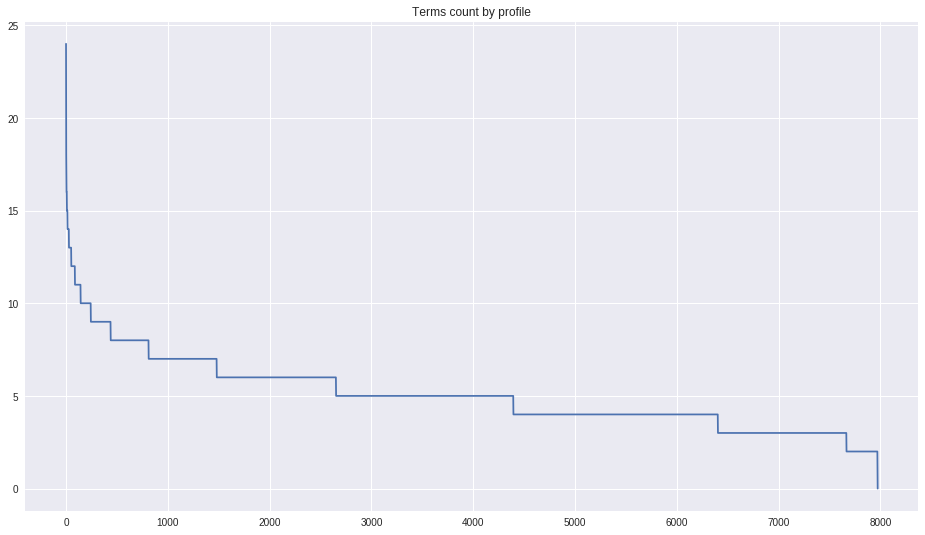

In [19]:
cntc_freqs= n_grams_counts.toarray().sum(axis=1)
cntc_indices = np.argsort(cntc_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
plt.figure(figsize=(16,9))
plt.plot(cntc_freqs[cntc_indices])
plt.title("Terms count by profile")
#txt_freqs[indices[:top_n]]
# plt.yscale('log')

col_0  count
row_0       
0          2
1          1
2        305
3       1263
4       2009
5       1742
6       1172
7        669
8        373
9        195
10       100
11        56
12        36
13        23
14        14
15         6
16         3
17         2
18         1
20         1
24         1


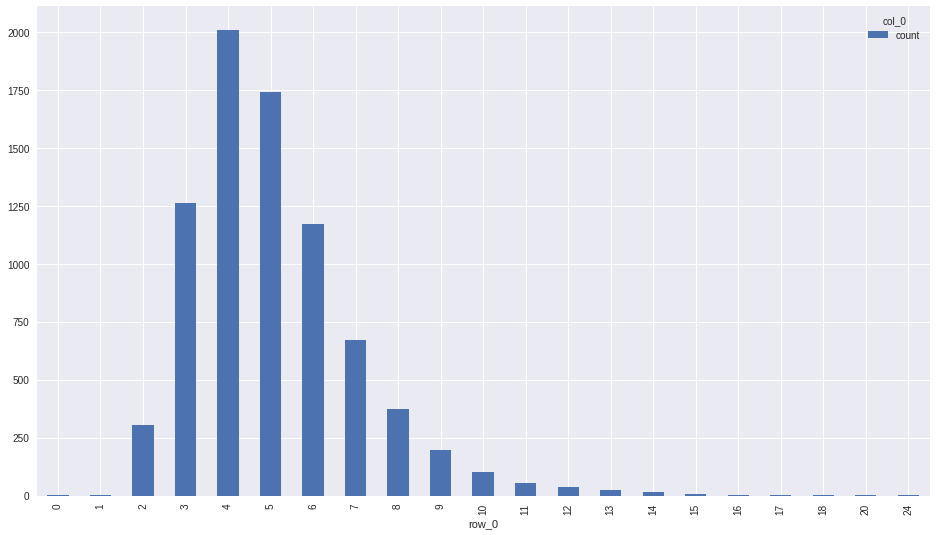

In [20]:
print(pd.crosstab(index=cntc_freqs, columns="count"))
pd.crosstab(index=cntc_freqs, columns="count").plot(kind="bar",figsize=(16,9))#/3409
#(cntc_freqs)

In [21]:
tfidf_transformer = TfidfVectorizer(stop_words=stp_wrds)
n_grams_tfidf = tfidf_transformer.fit_transform(data["Description"])
n_grams_tfidf.shape

(7974, 8701)

Text(0.5, 1.05, 'Term-frequence matrix')

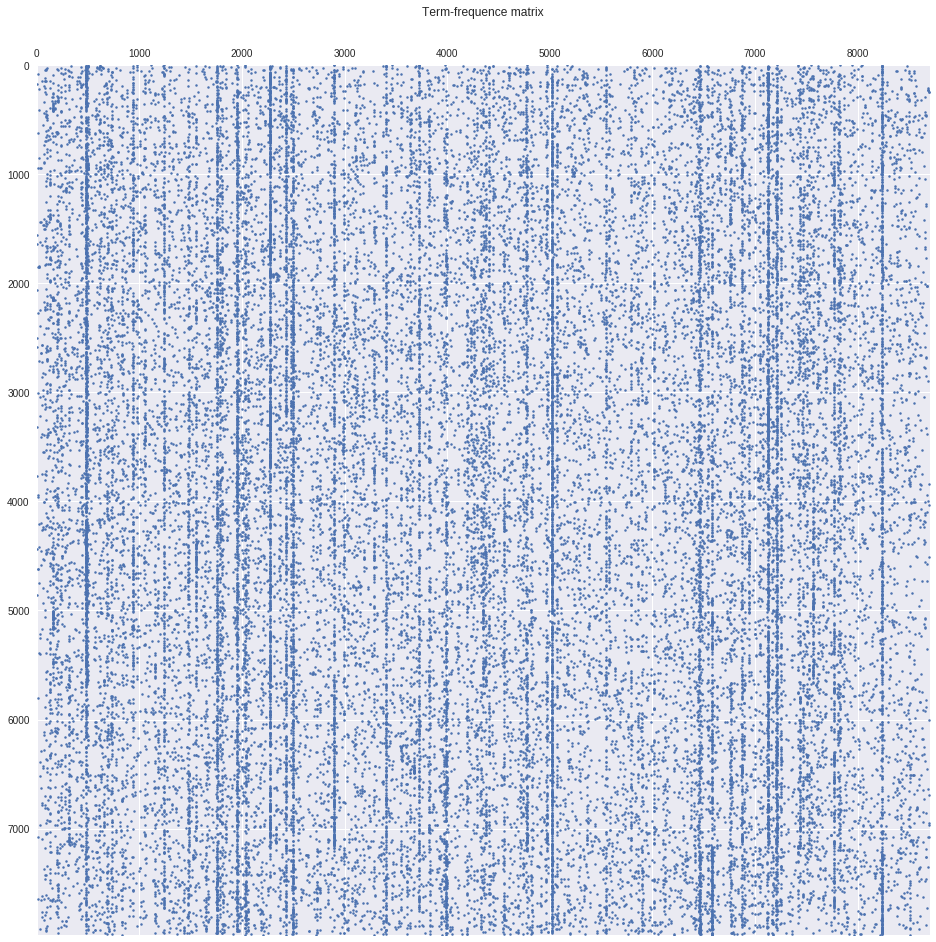

In [22]:
plt.figure(figsize=(16,16))
plt.spy(n_grams_counts,markersize=2.5, marker="o",aspect='auto')
plt.title("Term-frequence matrix")

In [0]:
# plt.figure(figsize=(16,16))
# plt.spy(n_grams_tfidf,markersize=2.5, marker="o",aspect='auto')#,markersize=3
# plt.title("tf-idf matrix")

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


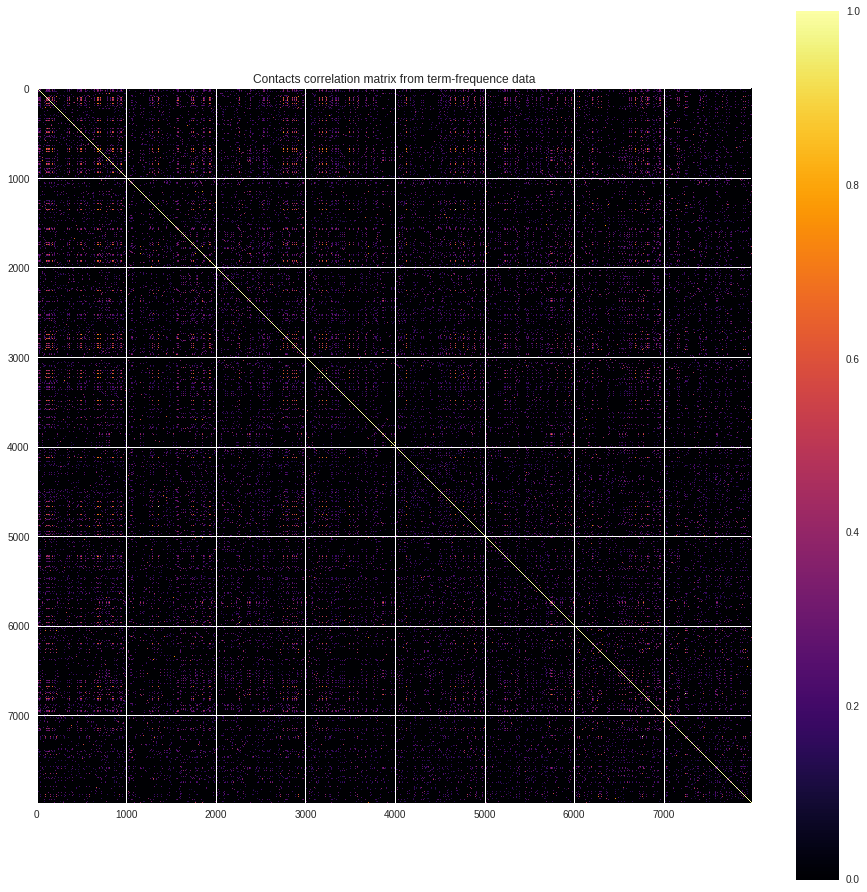

In [24]:
plt.figure(figsize=(16,16))
plt.imshow(np.corrcoef(n_grams_counts.toarray()), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from term-frequence data")
plt.colorbar()
plt.show()


# Latent Dirichlet Allocation embedding Ward and DB-scan culstering

## Topic extraction LDA

In [0]:
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()


In [26]:
lda = LatentDirichletAllocation(n_components=50, max_iter=15,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=0)
lda.fit(n_grams_counts)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=50.0,
                          max_doc_update_iter=100, max_iter=15,
                          mean_change_tol=0.001, n_components=50, n_jobs=None,
                          perp_tol=0.1, random_state=0, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)

In [27]:
print("\nTopics in LDA model:")
tf_feature_names = count_vect.get_feature_names()
print_top_words(lda, tf_feature_names, 15)


Topics in LDA model:
Topic #0: bpm grenzen médecins ärzte ohne frontières angularjs hooks familysearch brazil fgv libreria vendedora desenvolvedor polo
Topic #1: experto formobles formativa crdi autor medida comedia natalia inhouse aplica chez performia anciennement alter chargée
Topic #2: digital analysis institute latam sr technology operations big auxiliar administrative national communications control agency calidad
Topic #3: ai proyectos team cundinamarca investigadora facebook companys sede programas alimentos campus blue medellín new h2o
Topic #4: actuario españa accenture axa colpatria pricing bogota commerciales dev code chef ing eng release centers
Topic #5: asistente administrativa rosary médico economía visitador md entrenador pablo psiquiatra migraciones godoy permanencia electrónica lopez
Topic #6: risk banklombia people sistemas administrador microsoft office kpmg credit superior mercado cio auditoría formacion support
Topic #7: actuarial academy handytec dislexia rápid

In [0]:
LDA_embedd=lda.transform(n_grams_counts)

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


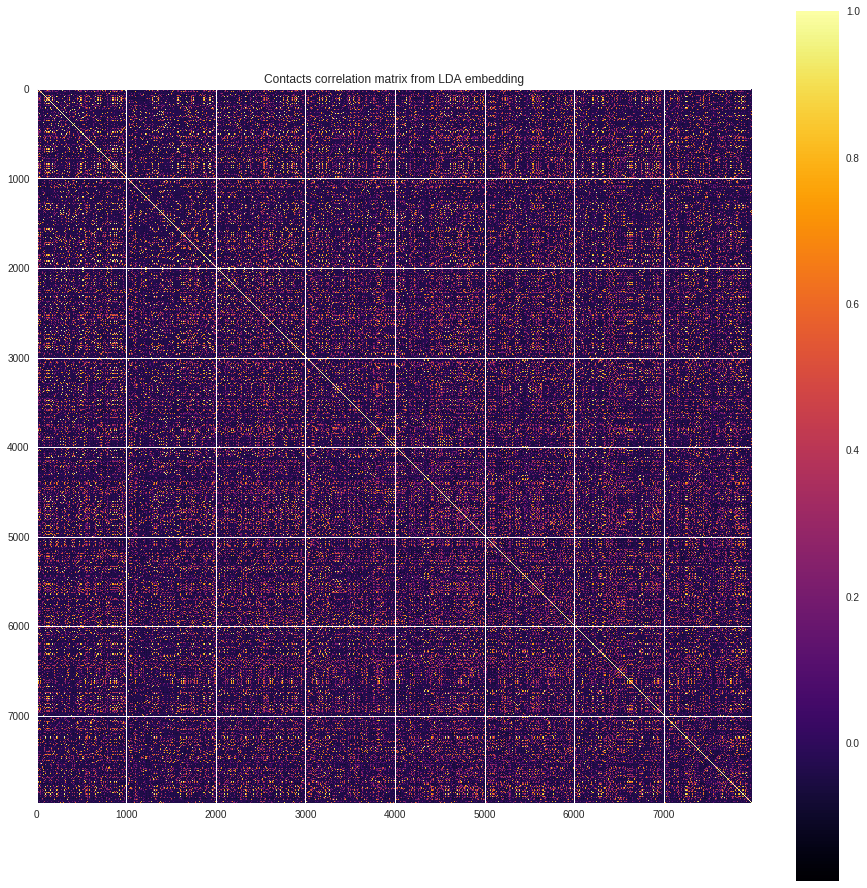

In [29]:
plt.figure(figsize=(16,16))
# plt.imshow(np.corrcoef(spect_emb_tfidf_12d), cmap=plt.cm.inferno, interpolation='nearest')
plt.imshow(np.corrcoef(LDA_embedd), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from LDA embedding")
plt.colorbar()
plt.show()

## DBScan CLustering

In [0]:
dist_mat_LDA=pairwise_distances(LDA_embedd)

In [0]:
dist_vec_LDA=dist_mat_LDA.flatten()

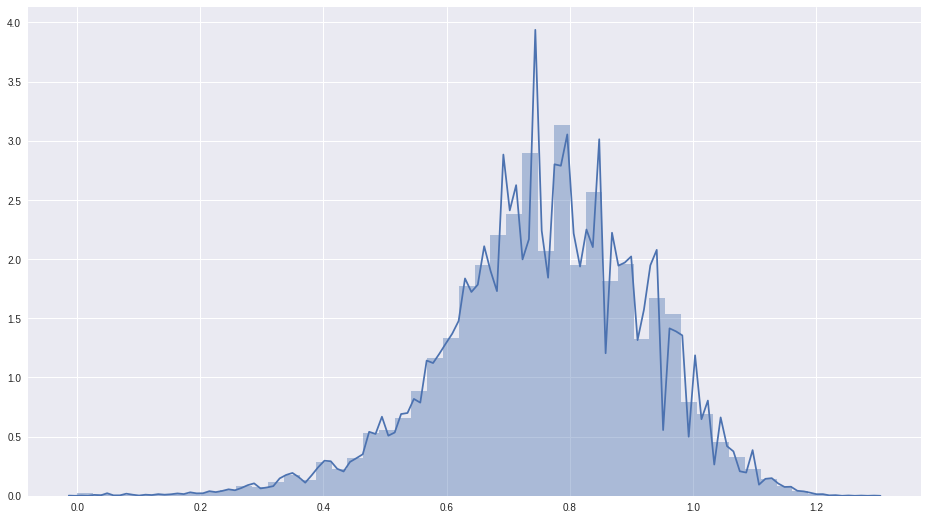

In [32]:
plt.figure(figsize=(16,9))
# plt.hist(n_grams_tfidf_dist_mat.flatten())
sns.distplot(dist_vec_LDA)
# sns.kdeplot()

In [0]:
freq_dists_LDA=pd.crosstab(index=np.round_(dist_vec_LDA,3), columns="count")

col_0  count
row_0       
0.000  38600
0.001      8
0.002     14
0.003     40
0.004     22
...      ...
0.302   2084
0.303   3810
0.304   2890
0.305   9572
0.306   3386

[300 rows x 1 columns]


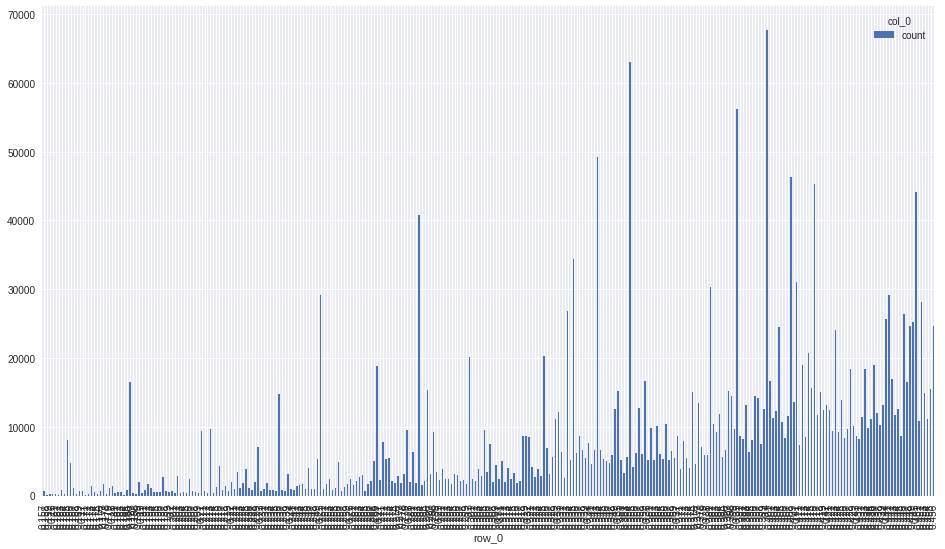

In [34]:
print(freq_dists_LDA.iloc[:300,:])#.iloc[:50,:])
freq_dists_LDA.iloc[150:450,:].plot(kind="bar",figsize=(16,9))#.iloc[:150,:]

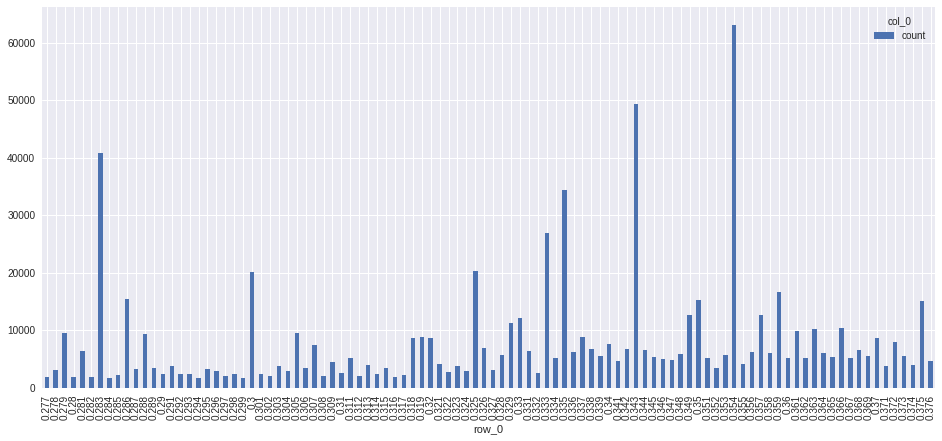

In [35]:
freq_dists_LDA.iloc[270:370,:].plot(kind="bar",figsize=(16,7))#.iloc[:150,:]

col_0,count
row_0,
-1,4595
0,596
1,356
2,685
3,328
4,364
5,265
6,261
7,289


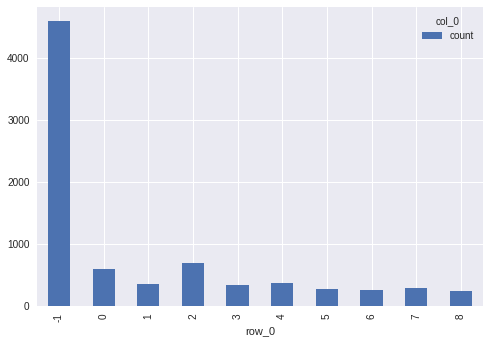

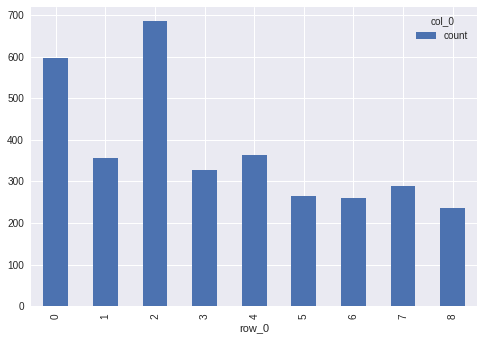

In [36]:
db_scan_LDA = DBSCAN(eps=.332, min_samples=200).fit(LDA_embedd)#.285#293#275#.293
LDA_db_labels = db_scan_LDA.labels_
pd.crosstab(index=LDA_db_labels, columns="count").plot(kind="bar")
pd.crosstab(index=LDA_db_labels, columns="count")[1:].plot(kind="bar")
pd.crosstab(index=LDA_db_labels, columns="count")

## Dendrogram (Ward) Clustering

In [0]:
contacts_ward_LDA=hierarchy.linkage(LDA_embedd, 'ward')

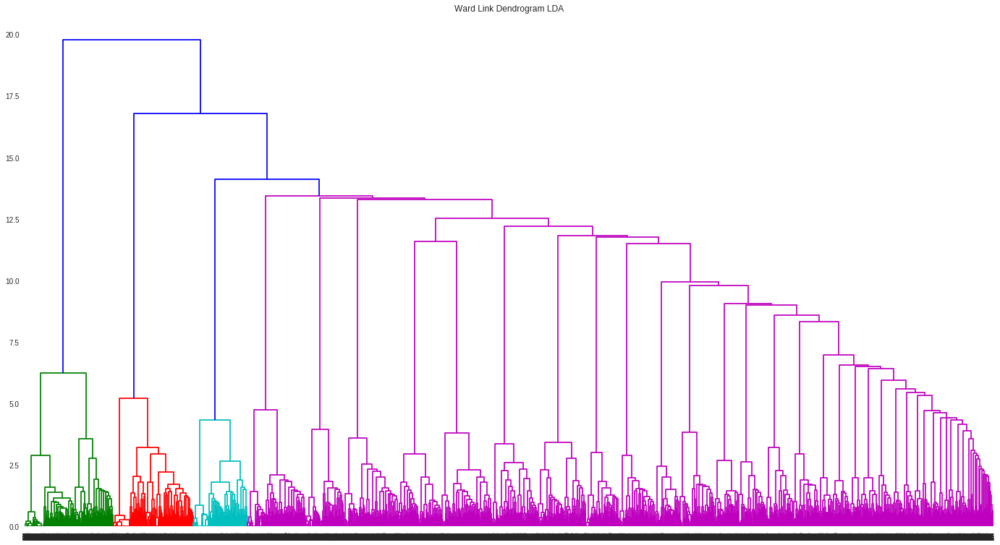

In [38]:
plt.figure(figsize=(24,13))#15,35
dn_tf = hierarchy.dendrogram(contacts_ward_LDA)#,orientation="left")
plt.title('Ward Link Dendrogram LDA')
plt.show()

In [0]:
connectivity = kneighbors_graph(LDA_embedd, n_neighbors=15, include_self=False)

In [40]:
clustering_30d_ward = AgglomerativeClustering(linkage='ward', n_clusters=max(LDA_db_labels)+1,connectivity=connectivity)
# clustering_12d_ward.fit(spect_emb_tfidf_12d)
clustering_30d_ward.fit(LDA_embedd)
# clustering.fit(n_grams_tfidf.toarray())

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 6 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=<7974x7974 sparse matrix of type '<class 'numpy.float64'>'
	with 119610 stored elements in Compressed Sparse Row format>,
                        distance_threshold=None, linkage='ward', memory=None,
                        n_clusters=9)

In [41]:
pd.crosstab(index=clustering_30d_ward.labels_, columns="count")

col_0,count
row_0,
0,3638
1,783
2,723
3,741
4,322
5,482
6,459
7,395
8,431


# Cluster Exploration

In [42]:
pd.crosstab(index=clustering_30d_ward.labels_, columns=LDA_db_labels, margins=True)

col_0,-1,0,1,2,3,4,5,6,7,8,All
row_0,,,,,,,,,,,
0,3295,18,15,53,16,14,2,11,4,210,3638
1,508,0,1,2,0,0,1,0,271,0,783
2,152,558,0,0,0,3,0,0,0,10,723
3,109,2,6,610,0,0,0,14,0,0,741
4,79,3,1,0,5,0,0,234,0,0,322
5,123,1,0,3,0,341,0,0,9,5,482
6,129,5,2,5,306,2,1,0,5,4,459
7,60,3,330,0,0,2,0,0,0,0,395
8,140,6,1,12,1,2,261,2,0,6,431


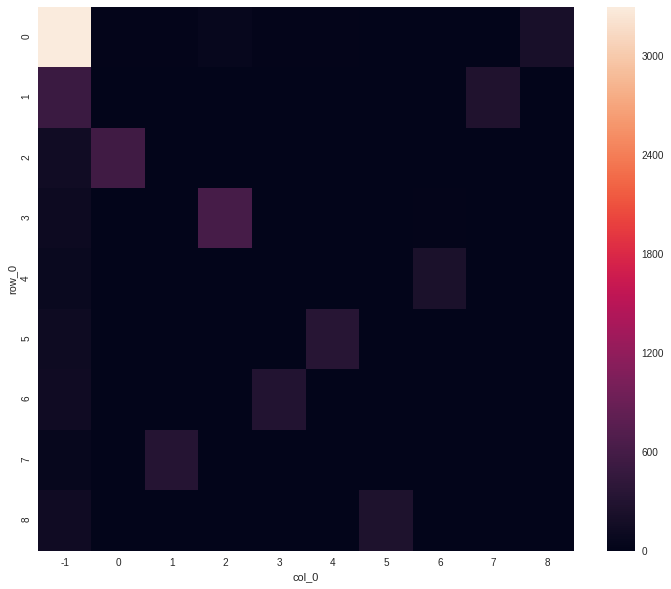

In [43]:
plt.figure(figsize=(12,10))
sns.heatmap(pd.crosstab(index=clustering_30d_ward.labels_, columns=LDA_db_labels, margins=False))

## Visualization

In [0]:
spect_emb_tfidf_3=manifold.SpectralEmbedding(n_components=3, n_jobs=-1).fit_transform(LDA_embedd)

In [0]:
spect_emb_tfidf_3=1000*spect_emb_tfidf_3

### DB Scan

In [0]:
# spect_emb_tfidf_3_denoised=LDA_embedd[LDA_db_labels>=0,:]
spect_emb_tfidf_3_denoised=spect_emb_tfidf_3[LDA_db_labels>=0,:]
LDA_db_labels_denoised=LDA_db_labels[LDA_db_labels>=0]

Text(0.5, 1.0, '2d spectral coordinates from 30D DB clusters')

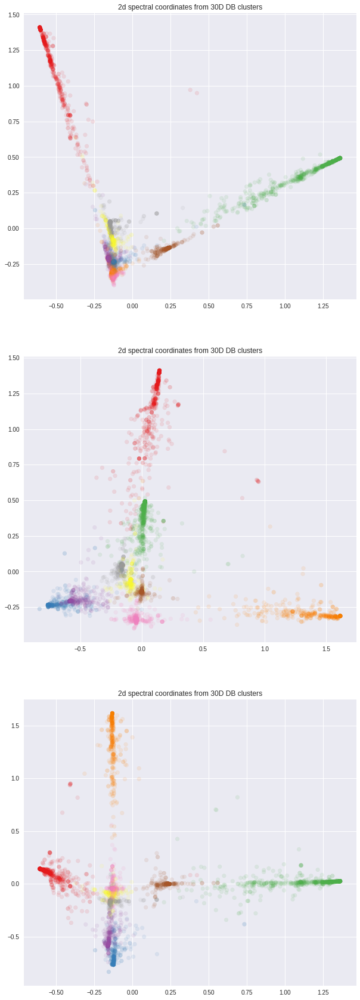

In [47]:
plt.figure(figsize=(10,30))
par_alf=0.1
plt.subplot(311)
plt.scatter(spect_emb_tfidf_3_denoised[:,0],spect_emb_tfidf_3_denoised[:,1], alpha=par_alf,s=45, c=LDA_db_labels_denoised, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D DB clusters")

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3_denoised[:,2],spect_emb_tfidf_3_denoised[:,1], alpha=par_alf,s=45, c=LDA_db_labels_denoised, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D DB clusters")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3_denoised[:,0],spect_emb_tfidf_3_denoised[:,2], alpha=par_alf,s=45, c=LDA_db_labels_denoised, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D DB clusters")

Text(0.5, 0.92, '3D spectral coordinates from 30D LDA embedding DBscan clusters')

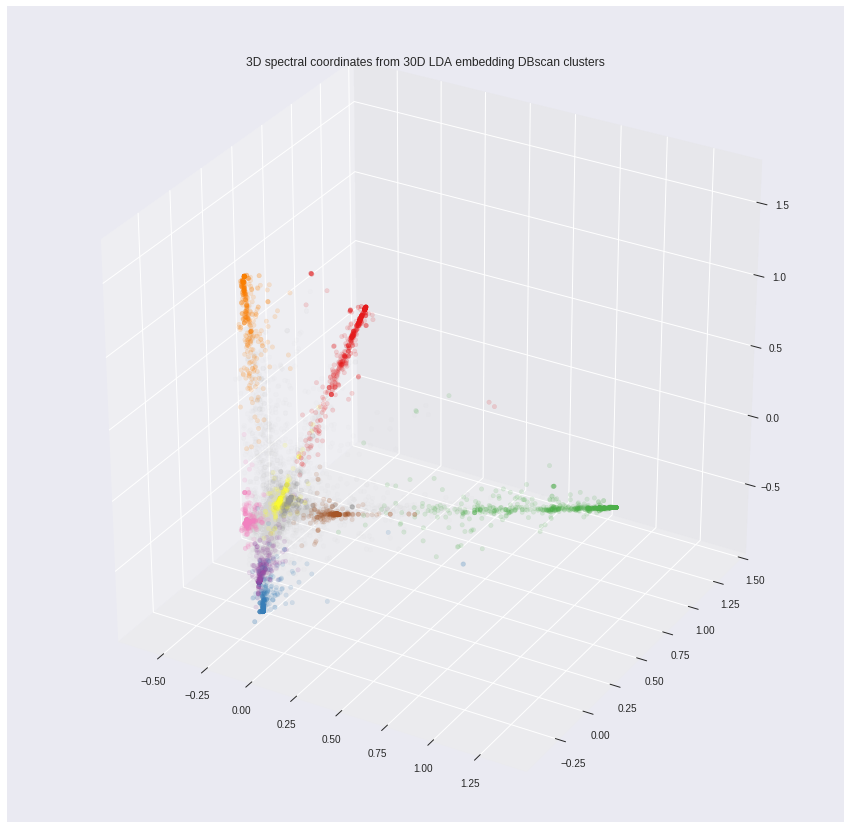

In [48]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3_denoised[:,0],
           spect_emb_tfidf_3_denoised[:,1],
           spect_emb_tfidf_3_denoised[:,2],
           c=LDA_db_labels_denoised, 
           alpha=0.15,
           cmap=plt.cm.Set1)
ax.scatter(spect_emb_tfidf_3[LDA_db_labels==-1,0],
           spect_emb_tfidf_3[LDA_db_labels==-1,1],
           spect_emb_tfidf_3[LDA_db_labels==-1,2],
           c="lightgrey", 
           alpha=0.05)

plt.title("3D spectral coordinates from 30D LDA embedding DBscan clusters")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


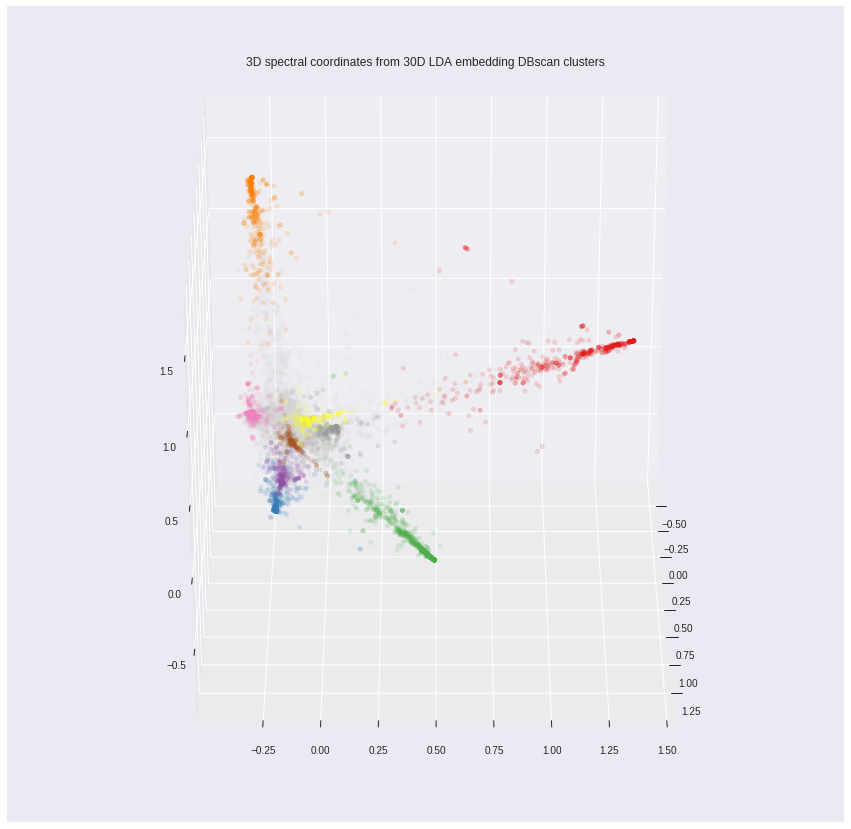

In [49]:
# https://stackoverflow.com/questions/51457738/animating-a-3d-scatterplot-with-matplotlib-to-gif-ends-up-empty
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3_denoised[:,0],
           spect_emb_tfidf_3_denoised[:,1],
           spect_emb_tfidf_3_denoised[:,2],
           c=LDA_db_labels_denoised, 
           alpha=0.15,
           cmap=plt.cm.Set1)
ax.scatter(spect_emb_tfidf_3[LDA_db_labels==-1,0],
           spect_emb_tfidf_3[LDA_db_labels==-1,1],
           spect_emb_tfidf_3[LDA_db_labels==-1,2],
           c="lightgrey", 
           alpha=0.05)

plt.title("3D spectral coordinates from 30D LDA embedding DBscan clusters")
# plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)

print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'DB_clustering_axis_LDAEmbedd_SpectCoords.gif', dpi=80, writer='imagemagick')

### Dendrogram (Ward)

Text(0.5, 1.0, '2d spectral coordinates from 30D Ward clusters')

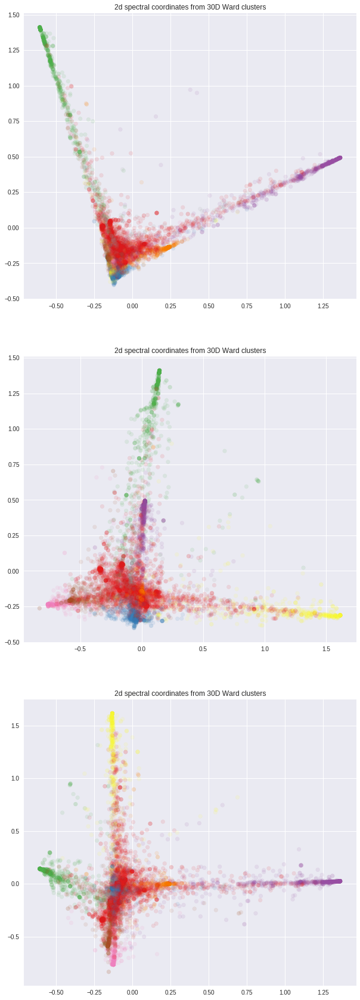

In [50]:
plt.figure(figsize=(10,30))
par_alf=0.1
plt.subplot(311)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D Ward clusters")

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3[:,2],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D Ward clusters")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,2], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D Ward clusters")

Text(0.5, 0.92, '3D spectral coordinates from 30D LDA embedding Ward clusters')

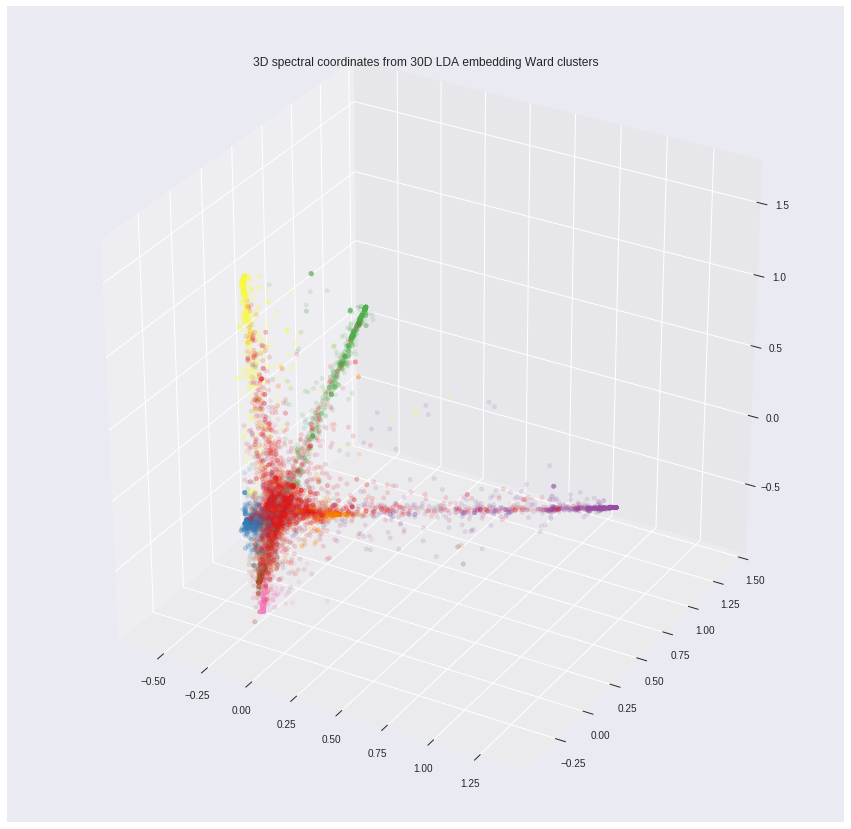

In [51]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3[:,0],
           spect_emb_tfidf_3[:,1],
           spect_emb_tfidf_3[:,2],
           c=clustering_30d_ward.labels_, 
           alpha=0.15,
           cmap=plt.cm.Set1)

plt.title("3D spectral coordinates from 30D LDA embedding Ward clusters")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


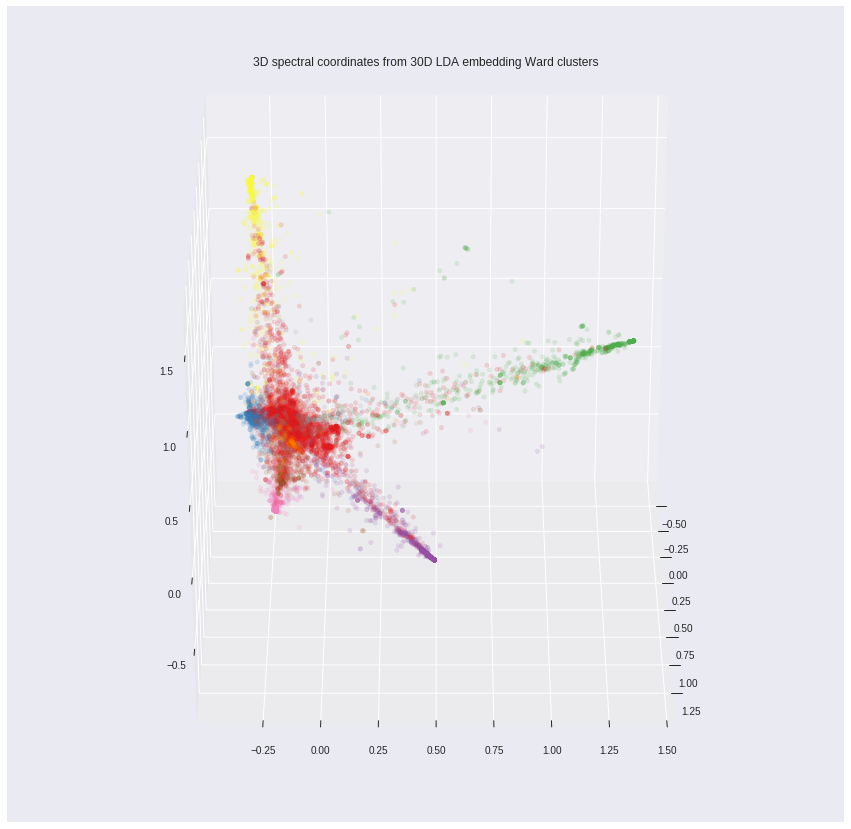

In [52]:
# https://stackoverflow.com/questions/51457738/animating-a-3d-scatterplot-with-matplotlib-to-gif-ends-up-empty
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3[:,0],
           spect_emb_tfidf_3[:,1],
           spect_emb_tfidf_3[:,2],
           c=clustering_30d_ward.labels_, 
           alpha=0.15,
           cmap=plt.cm.Set1)

plt.title("3D spectral coordinates from 30D LDA embedding Ward clusters")
# plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)

print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'Ward_clustering_axis_LDAEmbedd_SpectCoords.gif', dpi=80, writer='imagemagick')

## Word Cloud

In [0]:
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))

In [54]:
fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
clrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", ["#BF0A30", "#002868"])
#ff7f00''#f46d43','#e41a1c','#984ea3','#377eb8','#4daf4a'
##'#e41a1c','#984ea3','#377eb8'
"""
clrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#b2182b','#5e4fa2','#2166ac'])

clrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", [#'#a50026',
                                                                     '#d73027',
                                                                     '#f46d43',
                                                                     '#fdae61',
#                                                                      '#fee090',
#                                                                      '#ffffbf',
#                                                                      '#e0f3f8',
#                                                                      '#abd9e9',
                                                                     '#74add1',
                                                                     '#4575b4',
                                                                     '#313695'])
"""

'\nclrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", [\'#b2182b\',\'#5e4fa2\',\'#2166ac\'])\n\nclrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", [#\'#a50026\',\n                                                                     \'#d73027\',\n                                                                     \'#f46d43\',\n                                                                     \'#fdae61\',\n#                                                                      \'#fee090\',\n#                                                                      \'#ffffbf\',\n#                                                                      \'#e0f3f8\',\n#                                                                      \'#abd9e9\',\n                                                                     \'#74add1\',\n                                                                     \'#4575b4\',\n                                                

In [55]:
pic_wide=900
wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
wc.generate_from_frequencies(fr_dic)

(-0.5, 899.5, 384.5, -0.5)

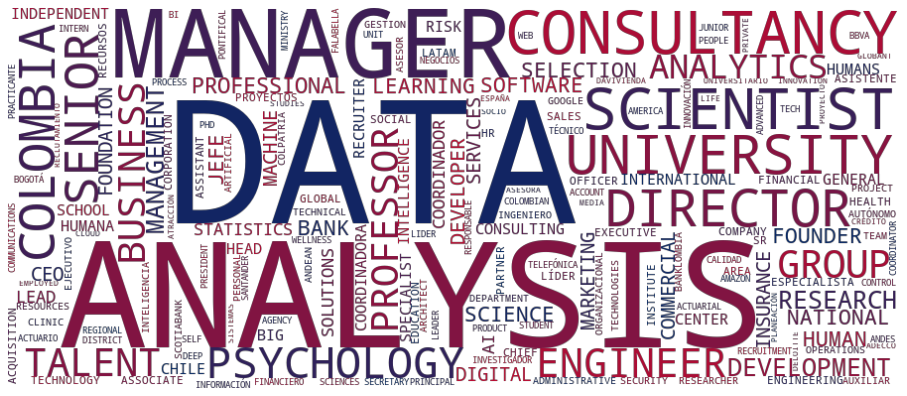

In [56]:
plt.figure(figsize=(16,9))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
# plt.savefig('wrdcld.png')

In [0]:
def wrd_cld_dic_clust(clust_labels,clust_id,top_n=300,pic_wide=900):
    txt_freqs= n_grams_counts.toarray()[clust_labels==clust_id].sum(axis=0)
    indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
    features =count_vect.get_feature_names()# vectorizer.get_feature_names()
    # top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
    top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
    fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
    wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
    wc.generate_from_frequencies(fr_dic)
    return wc


### Wordcloud Ward

(-0.5, 899.5, 384.5, -0.5)

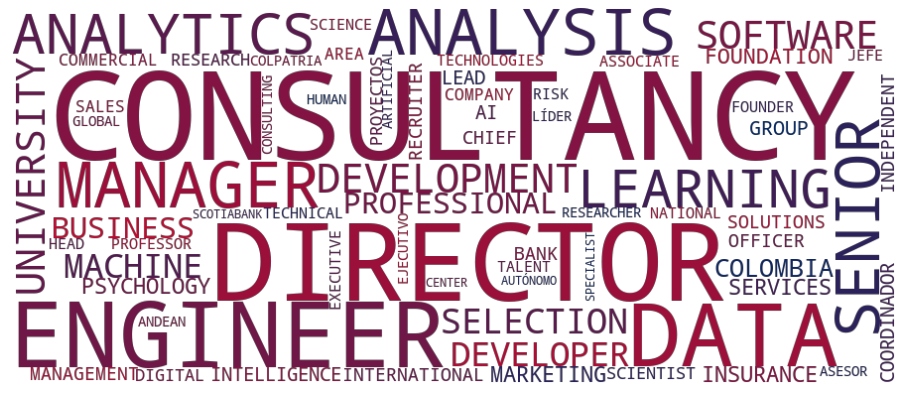

In [58]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,0,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

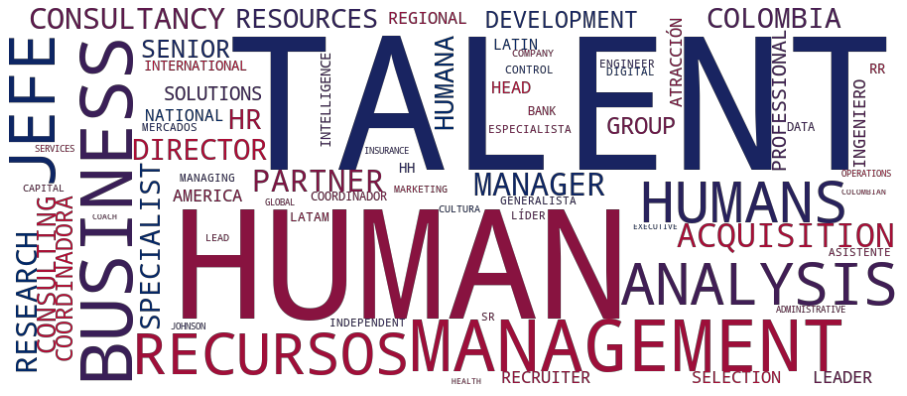

In [59]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,1,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

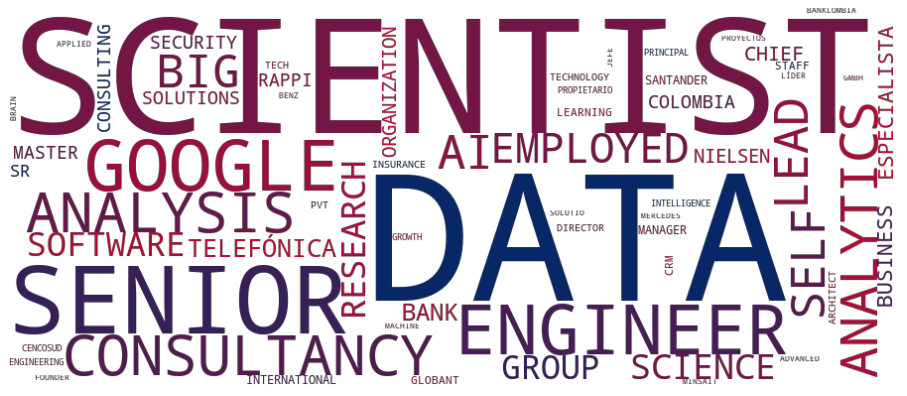

In [60]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,2,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

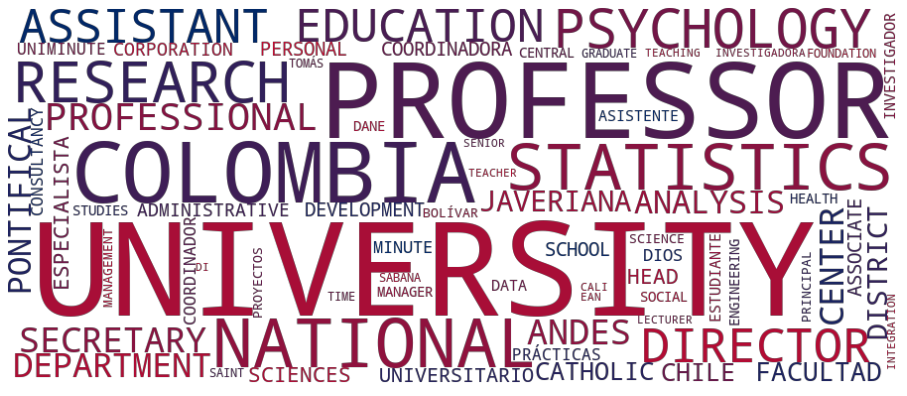

In [61]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,3,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

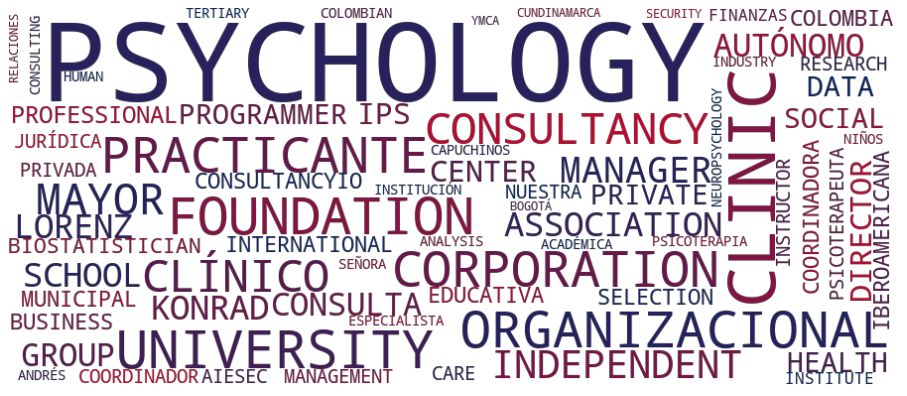

In [62]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,4,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

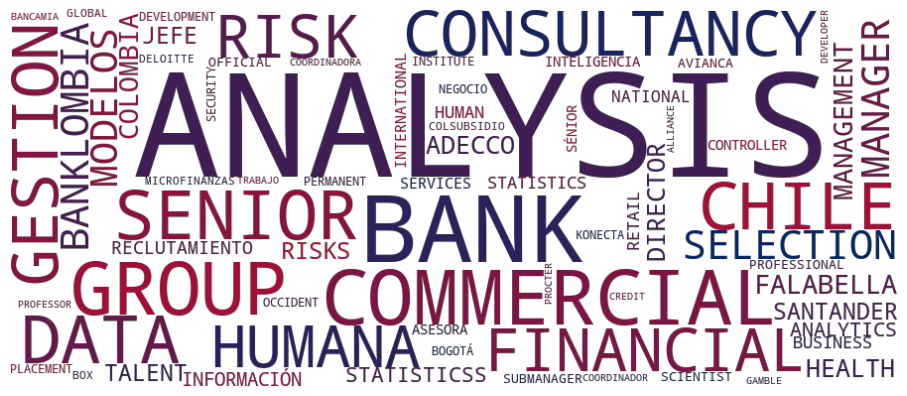

In [63]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,5,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

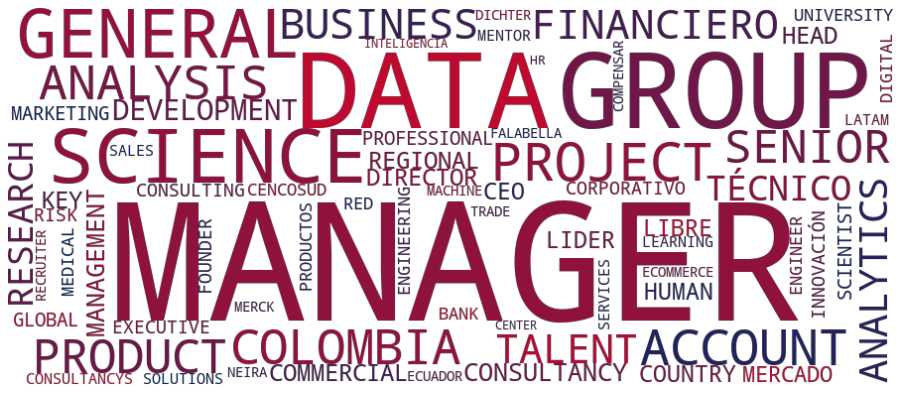

In [64]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,6,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

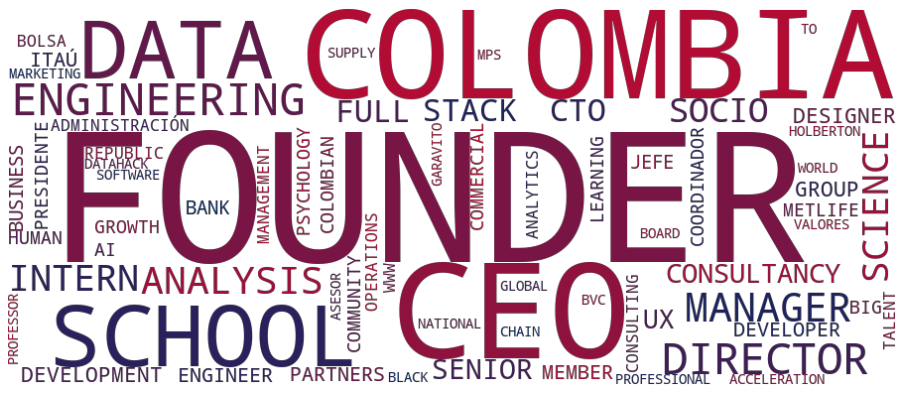

In [65]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,7,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

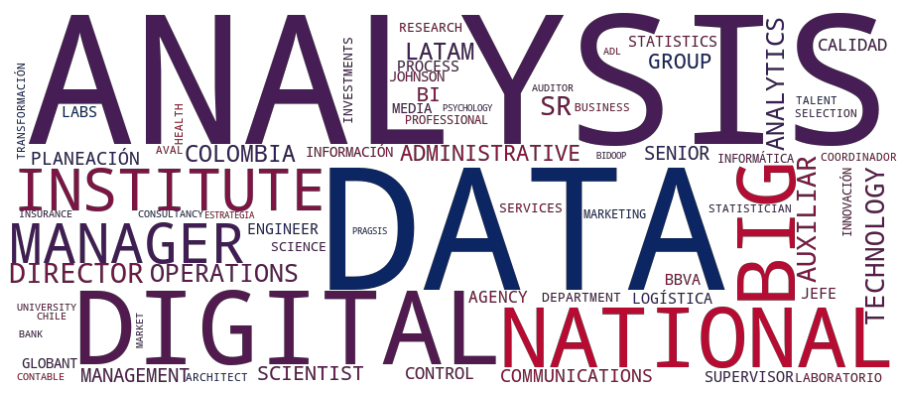

In [66]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,8,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

### DBScan

(-0.5, 899.5, 384.5, -0.5)

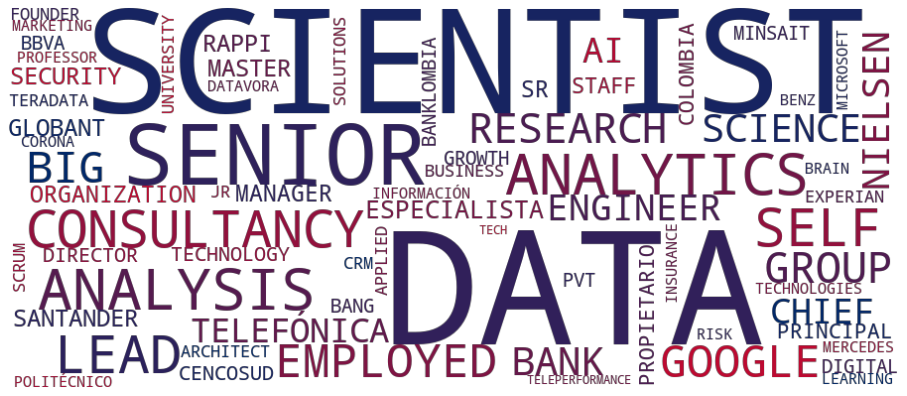

In [67]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,0,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

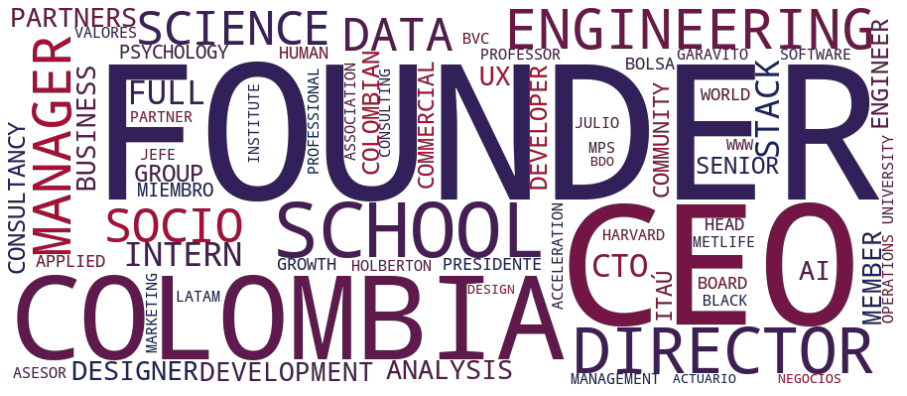

In [68]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,1,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

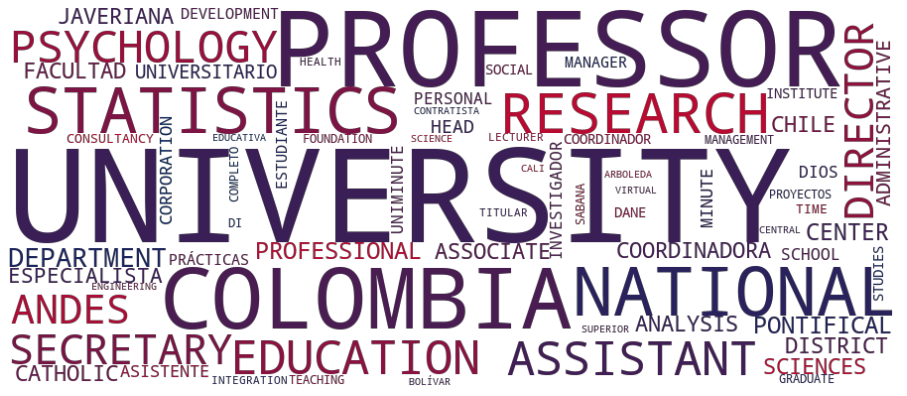

In [69]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,2,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

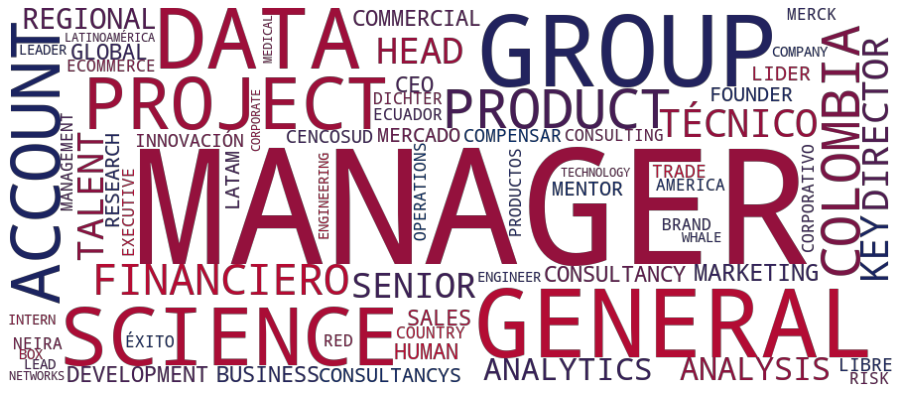

In [70]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,3,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

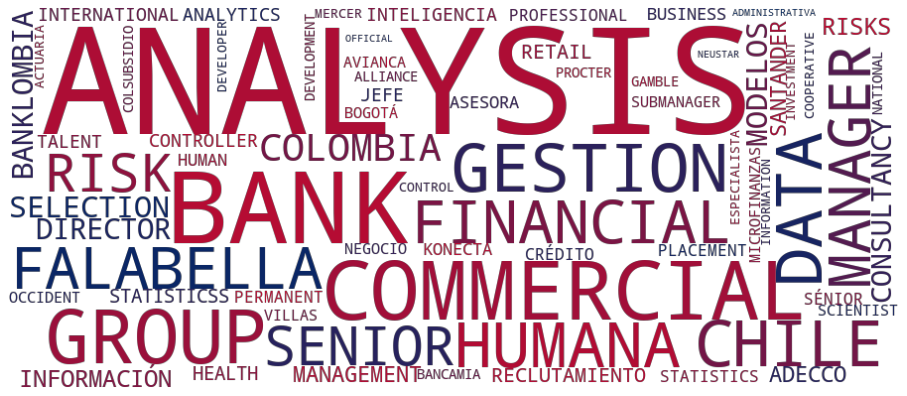

In [71]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,4,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

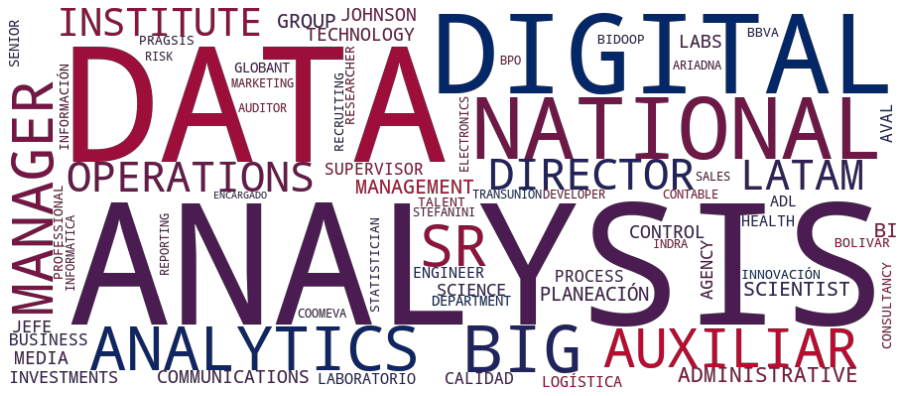

In [72]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,5,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

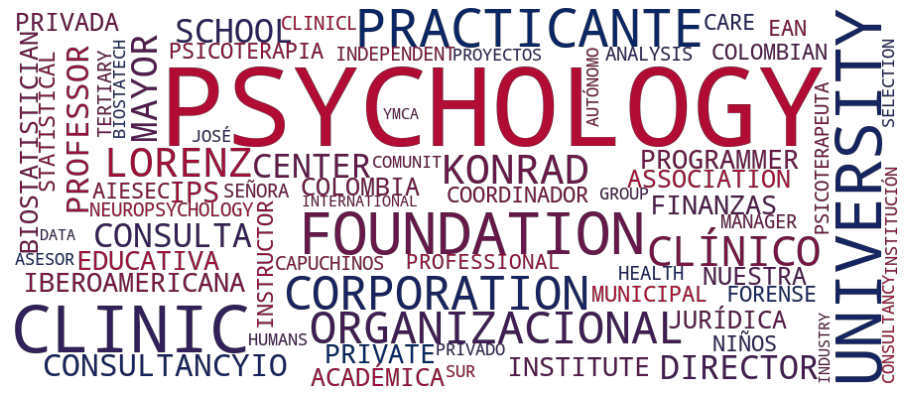

In [73]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,6,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

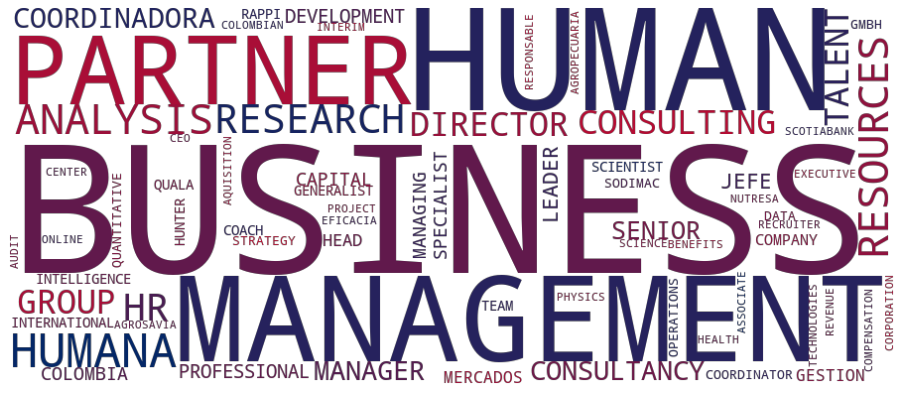

In [74]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,7,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

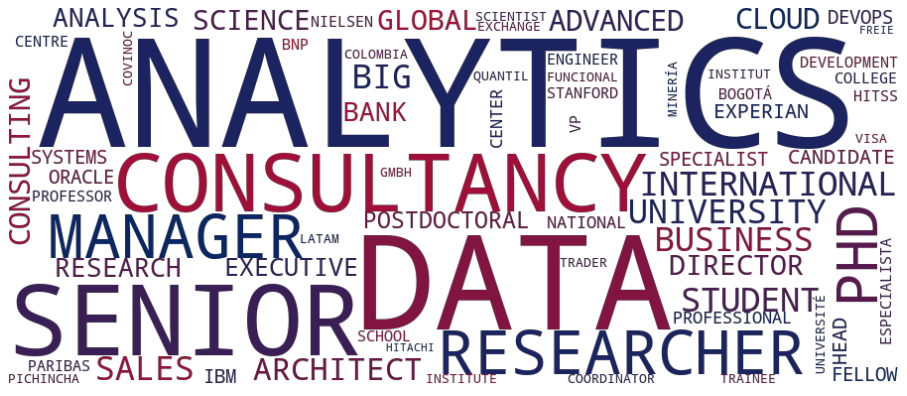

In [75]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,8,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

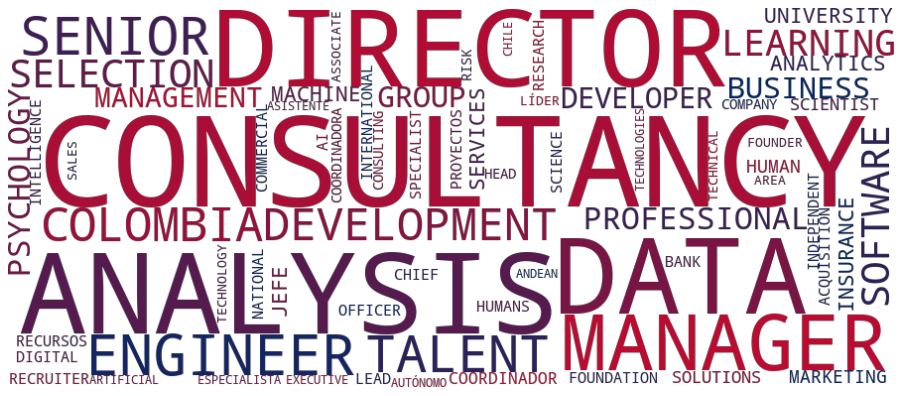

In [76]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,-1,70), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

In [77]:
end_exec=time.time()
print(end_exec-start_exec)

573.8135509490967


In [78]:
data["dbscan_cluster"]=LDA_db_labels
data["dendrogram_cluster"]=clustering_30d_ward.labels_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [79]:
data[[#"First Name",
      #"Last Name",
      #"Position",
      "Description",
      "dbscan_cluster","dendrogram_cluster"]].sample(25)

,Description,dbscan_cluster,dendrogram_cluster
256,independent / consultancy analysis de créditos...,4,5
4553,constructora bolivar s.a. professional of stat...,2,8
3186,action4-lab especialista en management de empl...,-1,0
196,worley process engineer b,-1,0
1579,fa information security finance lead,-1,0
3201,comisión national del servicio civil psycholog...,-1,3
5151,unit administrativa especial de catastro distr...,2,3
5694,bbva manager - risk analytics & technology,5,8
317,autónomo joven investigador,-1,0
4501,derrama magisterial analysis de risks de crédito,-1,0


# Checkpoint (Saving outputs)

In [0]:
data.to_csv(files_route+"data_clusters.csv")

In [0]:
output = open(files_route+'output_files.pkl', 'wb')
pickle.dump([n_grams_counts,#Matriz de ocurrencias
             LDA_embedd,#Embedding de clustering (30 dimensiones)
             spect_emb_tfidf_3,# Embedding de visualización (3 dimnensiones)
             clustering_30d_ward,#clustering dendrograma con método Ward
             db_scan_LDA# Clustering DbScan
             ], output)# Pickle dictionary using protocol 0.
output.close()

## Load data

In [0]:
data=pd.read_csv(files_route+"data_clusters.csv", index_col=0)

In [0]:
output = open(files_route+'output_files.pkl', 'rb')# Reading mode
n_grams_counts,LDA_embedd,spect_emb_tfidf_3,clustering_30d_ward,db_scan_LDA= pickle.load(output)
output.close()

In [84]:
pd.crosstab(data.dbscan_cluster, columns="count")

col_0,count
dbscan_cluster,
-1,4595
0,596
1,356
2,685
3,328
4,364
5,265
6,261
7,289


In [85]:
data.loc[data.dbscan_cluster==4,['Company','Position','Description']].sample(25)#'First Name','Last Name',

,Company,Position,Description
4779,BancoEstado,Analista de modelos de riesgos,bankestado analysis de modelos de risks
4672,Coopeuch,Jefe Desarrollo Comercial Medios de Pago,coopeuch jefe development commercial medios de...
2394,Konecta Colombia Oficial,Developer Analyst,konecta colombia official developer analysis
6405,Banco de Occidente,Analista de Selección y Desarrollo,bank de occident analysis de selection y devel...
4782,Isameti S.p.A.,Subgerente de Cobranzas,isameti s.p.a. submanager de cobranzas
4213,COLSUBSIDIO,Analista de Datos Estadísticos,colsubsidio analysis de data statisticss
5580,Michigan Master,Analista comercial,michigan master analysis commercial
3167,Grupo Bancolombia,Asistente Comercial,group banklombia asistente commercial
7072,Falabella Retail S.A,Asesor comercial de franquicias,falabella retail s.a asesor commercial de fran...
5878,Banco Falabella Colombia,Analista Senior Advanced Analytics,bank falabella colombia analysis senior advanc...


In [86]:
pd.crosstab(data.dbscan_cluster[data.Description.str.contains('data scientist', regex=False)],columns='count')

col_0,count
dbscan_cluster,
-1,81
0,410
1,1
3,2
4,6
5,10
8,2


In [87]:
pd.crosstab(data.dbscan_cluster[data.Description.str.contains('psychology', regex=False)],columns='count')

col_0,count
dbscan_cluster,
-1,168
1,8
2,46
3,2
4,3
6,174
7,1
8,1


In [88]:
data.loc[(data.dbscan_cluster==-1)&(data.Description.str.contains('data scientist', regex=False)),
         ['Company','Position','Description']].sample(25)#'First Name','Last Name',


,Company,Position,Description
3231,Technologist Corporation,Lead Data Scientist,technologist corporation lead data scientist
4359,iDATA ® - inteligencia analítica de clientes,Data Scientist en iDATA ® - inteligencia analí...,idata ® - inteligencia analytics de clientes d...
6165,Zurich North America,Data Scientist,zurich north america data scientist
3442,Blinker Professional Components,Data Scientist,blinker professional components data scientist
525,Quality Services International GmbH,Data Scientist,quality services international gmbh data scien...
7330,Tata Consultancy Services,Senior Data Scientist R&D( Architecting Prod...,tata consultancy services senior data scientis...
6729,Data Science Central,"Executive Data Scientist, Co-Founder, Managing...","data science central executive data scientist,..."
6908,"Honda R&D Americas, Inc.",Data Scientist,"honda r&d americas, inc. data scientist"
1331,Globant,Data Scientist - Software Designer | Artificia...,globant data scientist - software designer | a...
4733,MAS Global Consulting,Data Scientist,mas global consulting data scientist


In [89]:
print(pd.crosstab(data.dendrogram_cluster[data.Description.str.contains('data scientist', regex=False)],columns="count"))
print(pd.crosstab(data.dbscan_cluster[data.Description.str.contains('data scientist', regex=False)],columns="count"))

col_0               count
dendrogram_cluster       
0                      42
2                     433
3                       4
4                       2
5                       8
6                       7
7                       3
8                      13
col_0           count
dbscan_cluster       
-1                 81
 0                410
 1                  1
 3                  2
 4                  6
 5                 10
 8                  2


In [90]:
print(pd.crosstab(data.dendrogram_cluster[data.Description.str.contains('psychology', regex=False)],columns="count"))
print(pd.crosstab(data.dbscan_cluster[data.Description.str.contains('psychology', regex=False)],columns="count"))

col_0               count
dendrogram_cluster       
0                     113
1                       5
2                       1
3                      59
4                     204
5                       4
6                       4
7                       8
8                       5
col_0           count
dbscan_cluster       
-1                168
 1                  8
 2                 46
 3                  2
 4                  3
 6                174
 7                  1
 8                  1
